Importamos las librerias que vamos a usar.
Estas corresponden a numpy para el uso de arreglos o arrays, matplotlib.pyplot para la generación de las gráficas de curvas de nivel y como libreria fundamental para la iteración el archivo convolve, generate_binary_structure de la libreria scipy.ndimage, cuya función sera poder realizar la iteración sobre cada celda como producto de una convuloción que tiene como resultado arrojar el valor sobre cada celda del promedio de las 6 celdas alrededor (el potencial se realizo en el espacio es decir en 3D).

In [ ]:
pip install SciencePlots

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for SciencePlots: filename=SciencePlots-1.0.9-py3-none-any.whl size=6484 sha256=1c6dfcaefa09ec85e6a82c2c5e36059ad91e29f8c60ae486c19b50210361313e
  Stored in directory: /root/.cache/pip/wheels/37/f8/e9/b2f53a40b336388dfc57b108150daff7d6ffbbfc618dba3924
Successfully built SciencePlots


In [1]:
import numpy as np 
import matplotlib.pyplot as plt
plt.style.use(['science','notebook'])
from scipy.ndimage import convolve, generate_binary_structure 
import plotly.graph_objects as go
from IPython.display import HTML
import sympy as smp
import scipy as sp
from scipy.integrate import quad

A continuación definimos la medida de nuestro arreglo, el cual correspondera a el espacio.
Este arreglo corresponde a un conjunto de 3 arreglos dentro de un arreglo principal.

In [ ]:
N=100
grid=np.zeros((N,N,N))+0.5

Como un primer ejemplo crearemos dos placas paralelas cuadradas, una potencial positivo (1) y otra a potencial negativo (0), el primero de estos comenzara en x=y=30 y terminara en x=y=70 a una altura z=20, y el segundo tendra la mismas coordenadas x,y a una altura z=80.

In [ ]:
grid[30:70,30:70,20]=1
grid[30:70,30:70,80]=0
mask_pos = grid==1
mask_neg = grid==0

El grafico siguiente me permite visualizar la placa ubicada en z=20. Como se observa, la forma de llamar a esta posición es mediante la indexación [ : , : , 20 ], correspondiente a todos los elementos de X y Y a una altura z=20.

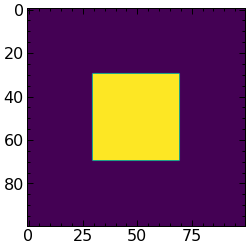

In [ ]:
plt.imshow(mask_pos[:,:,20])

Seguidamente realizamos lo mismo a la altura z=80.

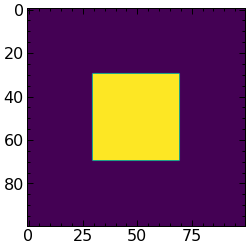

In [ ]:
plt.imshow(mask_neg[:,:,80])

Habiendo definido la posición de los conductores, se entra a la teoría del problema.

Como ${\nabla}^2 V=0$ en regiones donde no hay densidad de carga, y sabiendo que V es un campo escalar tenemos que:

${\nabla}^2 V=\frac{ \partial V^2}{{ \partial} ^2 x}+\frac{ \partial V^2}{{\partial} ^2 y}+\frac{ \partial V^2}{{\partial} ^2 z}=0$
Ahora, como sabemos $f(x+h)=f(x)+f'(x)h+\frac{f''(x)h^2}{2}+...$ y $f(x-h)=f(x)-f'(x)h+\frac{f''(x)h^2}{2}+...$, por lo que finalmente $f(x+h)+f(x-h)=2f(x)+f''(x)h^2$ llegando a la expresión final de $\frac{f(x+h)+f(x-h)-2f(x)}{h^2}=f''(x)$.
Aplicando la anterior relacion a cada una de las variables del potencial V entonces:

${\nabla}^2 V=\frac{V(x+h,y,z)+V(x-h,y,z)-2V(x,y,z)}{h^2}+\frac{V(x,y+h,z)+V(x,y-h,z)-2V(x,y,z)}{h^2}+\frac{V(x,y,z+h)+V(x,y,z-h)-2V(x,y,z)}{h^2}=0$

${\nabla}^2 V={V(x+h,y,z)+V(x-h,y,z)-2V(x,y,z)}+{V(x,y+h,z)+V(x,y-h,z)-2V(x,y,z)}+{V(x,y,z+h)+V(x,y,z-h)-2V(x,y,z)}=0$

$V(x,y,z)=\frac{V(x+h,y,z)+V(x-h,y,z)+V(x,y+h,z)+V(x,y-h,z)+V(x,y,z+h)+V(x,y,z-h)}{6}$

Y computacionalmente esto corresponde al promedio en una celda de la matriz espacial que se ha creado. Este promedio se entiende como el promedio de los valores de las celdas alrededor de la celda elegida inicialmente, es decir la posicion V[i,j,k] se promedia con los valores de las celdas V[i+1, j, k], V[i-1, j, k], V[i ,j+1 ,k ], V[i ,j-1 , k], V[i ,j ,k+1] y V[i, j, k-1].

Con el fin de poder fijar el potencial positivo en el conductor como 1, se solucionara el problema $\frac{V}{V_0}$, que sigue cumpliendo la ecuación de Laplace, donde $V_0$ es el potencial de el conductor dentro de la caja.

Del método de relajación sabemos que el iterar sobre toda la matriz esta operación debe converger a un valor en cada celda, el cual correspondera al valor real (normalizado) del potencial. Luego, como en toda iteración debemos elegir un valor inicial, que es lo que se realiza en la siguiente celda.

In [ ]:
yv, xv, zv =np.meshgrid(np.arange(N),np.arange(N),np.arange(N))

In [ ]:
grid=1-zv/100

Se eligió este valor aproximado ya que la placa con mayor potencial se encuentra en z=20, y en valores de z alrededor a este valor el valor de potencial es mayor que para z alrededor de z=80, donde la placa se encuentra a menor potencial.

In [ ]:
grid[:,:,99]

array([[0.01, 0.01, 0.01, ..., 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, ..., 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, ..., 0.01, 0.01, 0.01],
       ...,
       [0.01, 0.01, 0.01, ..., 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, ..., 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, ..., 0.01, 0.01, 0.01]])

In [ ]:
grid[1,:,:]

array([[1.  , 0.99, 0.98, ..., 0.03, 0.02, 0.01],
       [1.  , 0.99, 0.98, ..., 0.03, 0.02, 0.01],
       [1.  , 0.99, 0.98, ..., 0.03, 0.02, 0.01],
       ...,
       [1.  , 0.99, 0.98, ..., 0.03, 0.02, 0.01],
       [1.  , 0.99, 0.98, ..., 0.03, 0.02, 0.01],
       [1.  , 0.99, 0.98, ..., 0.03, 0.02, 0.01]])

In [ ]:
grid[:,:,0]

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

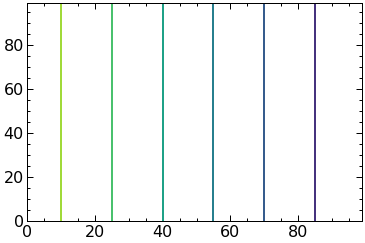

In [ ]:
plt.contour(grid[0])
#Y VX Z

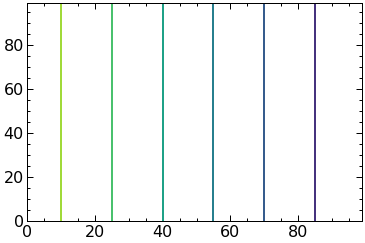

In [ ]:
plt.contour(grid[:,0])
#x vs z

Luego, mediante el codigo generate_binary_structure, definimos una estructura que se aplicara sobre nuestra matriz espacial. Observandose lo que se desea hacer se concluye que la idea fundamental de la iteración es una convolución sobre la matriz espacial.

In [5]:
kern=generate_binary_structure(3,1).astype(float)/6
kern[1,1,1]=0
kern

array([[[0.        , 0.        , 0.        ],
        [0.        , 0.16666667, 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.        , 0.16666667, 0.        ],
        [0.16666667, 0.        , 0.16666667],
        [0.        , 0.16666667, 0.        ]],

       [[0.        , 0.        , 0.        ],
        [0.        , 0.16666667, 0.        ],
        [0.        , 0.        , 0.        ]]])

Recordemos que la convolusión de una matriz lo que hace es definir un kernel que se aplicara sobre la matriz original. El kernel se aplicara sobre un elemento inicial y este cerra reemplazado con la suma de los elementos sobre los cuales se apliquen los elementos de la matriz. Así que definimos la matriz para que sea 1/6 de cada uno de los elementos sobre los cuales necesitamos el promedio.

Luego de esto, definimos las condiones iniciales encerrando a nuestro problema en una 'caja' de potencial cero en sus paredes, para limitar el problema a una parte del espacio. Estas condiciones iniciales nos permiten establecer que la fila justo despues de las paredes tiene un potencial que es aproximadamente igual al potencial sobre estas mismas, y así definimos las condiciones de frontera. 
Un argumento para fijar estas condiciones iniciales como se hacen es que la derivada del potencial sobre un conductor con respecto a la normal a esta superficie conductora es igual a $\frac{-\rho}{\epsilon _0}$, y como $\rho =0$ entonces esta derivada sera igual a cero. Con esto en mente, podemos representar este efecto númericamente especificando que un pequeño cambio en la dirección normal a la pared conductora no afectara a la primera siguiente celda.

In [4]:
def neumann(a):
    a[0,:,:]=a[1,:,:];a[-1,:,:]=a[-2,:,:]
    a[:,0,:]=a[:,1,:];a[:,-1,:]=a[:,-2,:]
    a[:,:,0]=a[:,:,1];a[:,:,-1]=a[:,:,-2]
    return a

Luego, con el fin de saber el error entre iteraciones sucesivas definimos la variable $\textbf{err}$. 

La iteración que se realizara a continuación consta de varías partes:
1) Generar la convolusión entre la matriz espacial (grid) y la matriz promedio (kern). 
2) Proporcionar las condiciones de frontera en cada iteración con el fin de mantener la frontera existente y permitir que el método converja.

In [ ]:
err=[]
iters=2000
for i in range(iters):
    grid_update=convolve(grid,kern,mode='constant')
    #Boundary Conditions (neumann)
    grid_updated=neumann(grid_update)
    #Boundary conditions(dirchlett)
    grid_update[mask_pos]=1
    grid_update[mask_neg]=0
    #see what error is between concescutive arrays
    err.append(np.mean((grid-grid_updated)**2))
    grid=grid_update

Finalmente gráficamos en x=50 (como si cortaramos una rebanada del plano yz) con el fin de observar lambas placas.

Si se desea cambiar la rebanada del plano yz, cambiamos el comando slc.

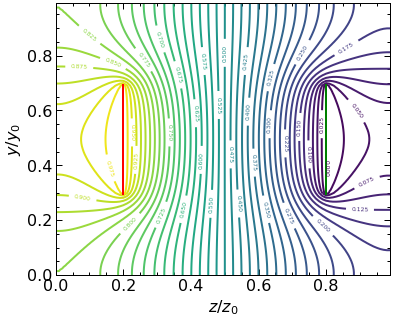

In [ ]:
slc=50
plt.figure(figsize=(6,5))
CS=plt.contour(np.arange(100)/100, np.arange(100)/100, grid[:,slc], levels=40)
plt.clabel(CS,CS.levels, inline=True, fontsize=6)
plt.xlabel('$z/z_0$')
plt.ylabel('$y/y_0$')
plt.axvline(0.2, ymin=0.3, ymax=0.7,color='r')
plt.axvline(0.8, ymin=0.3, ymax=0.7,color='g')

Un comando por debajo de 30 deberia generar un potencial menos "apretado" en la zona entre los conductores.

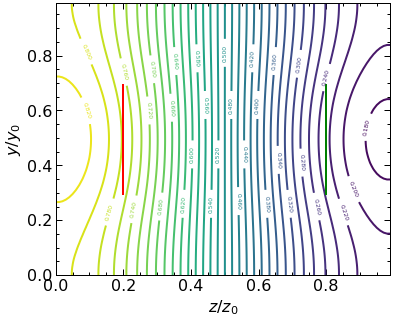

In [ ]:
slc=10
plt.figure(figsize=(6,5))
CS=plt.contour(np.arange(100)/100, np.arange(100)/100, grid[:,slc], levels=40)
plt.clabel(CS,CS.levels, inline=True, fontsize=6)
plt.xlabel('$z/z_0$')
plt.ylabel('$y/y_0$')
plt.axvline(0.2, ymin=0.3, ymax=0.7,color='r')
plt.axvline(0.8, ymin=0.3, ymax=0.7,color='g')

Para aplicar ese proceso a otro problema lo unico que se debe hacer es crear una superficie diferente dentro de la matriz espacio, en caso de que se quiera, como una esfera compacta.

In [ ]:
grid2=np.zeros((100,100,100))+0.5

Con el fin de definir la esfera compacta, definimos un radio, de tal manera que

In [ ]:
xv,yv,zv=np.meshgrid(np.arange(100),np.arange(100),np.arange(100))
r=10
f=(xv-49)**2+(yv-49)**2+(zv-49)**2
mask_pos = f<=r**2
grid=np.zeros((100,100,100))

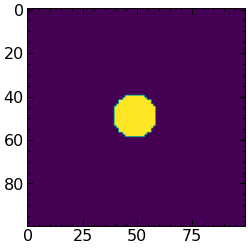

In [ ]:
plt.imshow(mask_pos[:,:,50])

In [ ]:
err=[]
iters=2000
for i in range(iters):
    grid_update=convolve(grid,kern,mode='constant')
    #Boundary Conditions (neumann)
    grid_updated=neumann(grid_update)
    #Boundary conditions(dirchlett)
    grid_update[mask_pos]=1
    #grid_update[mask_neg]=0
    #see what error is between concescutive arrays
    err.append(np.mean((grid-grid_updated)**2))
    grid=grid_update

Text(0, 0.5, '$y/y_0$')

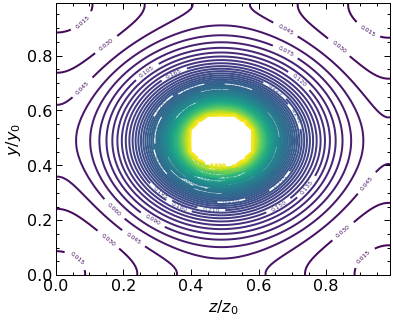

In [ ]:
slc=50
plt.figure(figsize=(6,5))
CS=plt.contour(np.arange(100)/100, np.arange(100)/100, grid[:,slc], levels=70)
plt.clabel(CS,CS.levels, inline=True, fontsize=6)
plt.xlabel('$z/z_0$')
plt.ylabel('$y/y_0$')
#plt.axvline(0.2, ymin=0.3, ymax=0.7,color='r')
#plt.axvline(0.8, ymin=0.3, ymax=0.7,color='g')

Si ahora lo que queremos son dos esferas, ambas al misma potencial entonces definimos las superficies como

In [ ]:
f=(xv-49)**2+(yv-19)**2+(zv-49)**2
g=(xv-49)**2+(yv-79)**2+(zv-49)**2
mask_pos= f<=r**2
mask_neg= g<=r**2

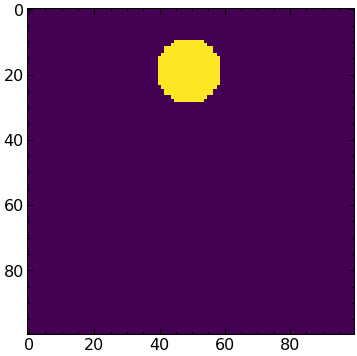

In [ ]:
plt.imshow(mask_pos[:,:,50])

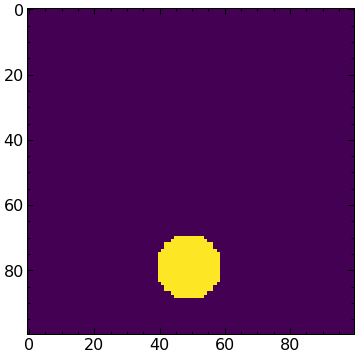

In [ ]:
plt.imshow(mask_neg[:,:,50])

In [ ]:
grid=np.zeros((100,100,100))+0.5

In [ ]:
err=[]
iters=2000
for i in range(iters):
    grid_update=convolve(grid,kern,mode='constant')
    #Boundary Conditions (neumann)
    grid_updated=neumann(grid_update)
    #Boundary conditions(dirchlett)
    grid_update[mask_pos]=1
    grid_update[mask_neg]=0
    #see what error is between concescutive arrays
    err.append(np.mean((grid-grid_updated)**2))
    grid=grid_update

Text(0, 0.5, '$y/y_0$')

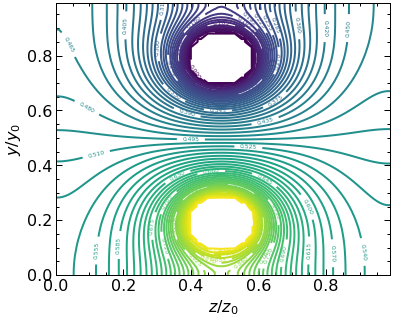

In [ ]:
slc=50
plt.figure(figsize=(6,5))
CS=plt.contour(np.arange(100)/100, np.arange(100)/100, grid[:,slc], levels=70)
plt.clabel(CS,CS.levels, inline=True, fontsize=6)
plt.xlabel('$z/z_0$')
plt.ylabel('$y/y_0$')

Finalmente si lo que queremos es generar un cascarón esferico y encontrar el potencial entonces generamos la siguiente superficie.

In [ ]:
xv,yv,zv=np.meshgrid(np.arange(100),np.arange(100),np.arange(100))
cond=np.zeros((100,100,100))

In [ ]:
r=10
f= (xv-19)**2+(yv-19)**2+(zv-49)**2
g= (xv-79)**2+(yv-79)**2+(zv-49)**2
mask_pos = f<=r**2
mask_neg = g<=r**2
mask_pos1 = f>(r+1)**2
mask_neg1 = g>(r+1)**2
for _ in (cond[:,:,37:62]):
    cond[:50,:50,37:62]=mask_pos[:50,:50,37:62]+mask_pos1[:50,:50,37:62]
    cond[50:,50:,37:62]=mask_neg[50:,50:,37:62]+mask_neg1[50:,50:,37:62]
for _ in (cond[:,:,:37]):
    cond[:,:,:37]=1
for _ in (cond[:,:,62:]):
    cond[:,:,62:]=1
for _ in (cond[50:,:50,37:62]):
    cond[50:,:50,37:62]=1
for _ in (cond[:50,50:,37:62]):
    cond[:50,50:,37:62]=1
#mask_pos[:,:,:37]==False
#mask_pos= mask_pos+mask_pos2+mask_pos3
#mask_neu = f>r**2 
#masK_neu2 = g>r**2
mask_pos= cond==0

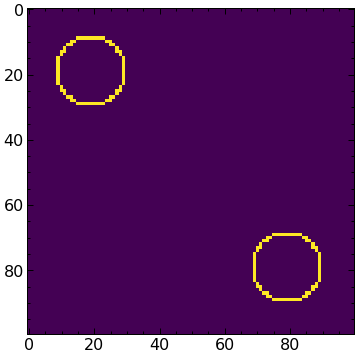

In [ ]:
plt.imshow(mask_pos[:,:,50])

In [ ]:
grid=np.zeros((100,100,100))+0.5

In [ ]:
err=[]
iters=2000
for i in range(iters):
    grid_update=convolve(grid,kern,mode='constant')
    #Boundary Conditions (neumann)
    grid_updated=neumann(grid_update)
    #Boundary conditions(dirchlett)
    grid_update[mask_pos]=1
   # grid_update[cond2]=1
    #see what error is between concescutive arrays
    err.append(np.mean((grid-grid_updated)**2))
    grid=grid_update

Text(0, 0.5, 'y/y_0')

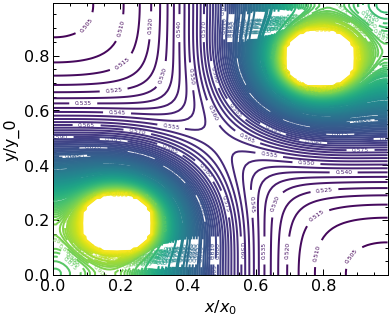

In [ ]:
slc=50
plt.figure(figsize=(6,5))
CS=plt.contour(np.arange(100)/100, np.arange(100)/100, grid[:,:,50], levels=100)
plt.clabel(CS,CS.levels, inline=True, fontsize=6)
plt.xlabel('$x/x_0$')
plt.ylabel('y/y_0')
#plt.imshow(mask_pos[:,:,50])
#plt.imshow(mask_neg[:,:,50])

Recordando que el campo electrico dentro de un cascarón esferico es nulo entonces podemos aceptar este resultado.

Para continuar, se propine pintar el campoe electrico de estas configuraciones de carga, para lo cual definimos los siguientes pasos:
1) Generar el campo electrico como el gradiente del potencial.
2) Relacionar el campo electrico con las posiciones en el espacio.
3) Pintar el campo electrico.


De nuevo, como sabemos $f(x+h)=f(x)+f'(x)h+\frac{f''(x)h^2}{2}+...$ y $f(x-h)=f(x)-f'(x)h+\frac{f''(x)h^2}{2}+...$
y por lo tanto $f(x+h)-f(x-h)=2f'(x)h$ para una expresión final de $\frac{f(x+h)-f(x-h)}{2h}=f'(x)$. 
Con esto podemos el gradiente de V como:
$\nabla V=\frac{V(x+h,y,z)-V(x-h,y,z)}{2h}\hat{i}+\frac{V(x,y+h,z)-V(x,y-h,z)}{2h}\hat{j}+\frac{V(x,y,z+h)-V(x,y,z-h)}{2h}\hat{k}$

Generemos el campo electrico de la esfera compacta.

In [2]:
xv,yv,zv=np.meshgrid(np.arange(100),np.arange(100),np.arange(100))
r=10
f=(xv-49)**2+(yv-49)**2+(zv-49)**2
mask_pos = f<=r**2
grid=np.zeros((100,100,100))

In [6]:
err=[]
iters=2000
for i in range(iters):
    grid_update=convolve(grid,kern,mode='constant')
    #Boundary Conditions (neumann)
    grid_updated=neumann(grid_update)
    #Boundary conditions(dirchlett)
    grid_update[mask_pos]=1
   # grid_update[cond2]=1
    #see what error is between concescutive arrays
    err.append(np.mean((grid-grid_updated)**2))
    grid=grid_update

Text(0, 0.5, 'y/y_0')

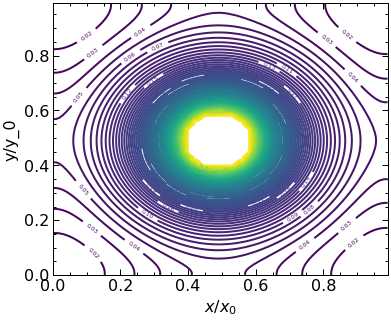

In [7]:
slc=50
plt.figure(figsize=(6,5))
CS=plt.contour(np.arange(100)/100, np.arange(100)/100, grid[:,:,50], levels=100)
plt.clabel(CS,CS.levels, inline=True, fontsize=6)
plt.xlabel('$x/x_0$')
plt.ylabel('y/y_0')
#plt.imshow(mask_pos[:,:,50])
#plt.imshow(mask_neg[:,:,50])

In [8]:
V=grid
xv,yv,zv=np.meshgrid(np.arange(49),np.arange(49),np.arange(49))
def E(x, y, z):
    return np.array([-(V[2*x+1][2*y][2*z]-V[2*x-1][2*y][2*z])/2,-(V[2*x][2*y+1][2*z]-V[2*x][2*y-1][2*z])/2,-(V[2*x][2*y][2*z+1]-V[2*x][2*y][2*z-1])/2])

In [9]:
E_field=np.vectorize(E, signature='(),(),()->(n)')(xv, yv, zv)
Ex=300*E_field[:,:,:,0]
Ey=300*E_field[:,:,:,1]
Ez=300*E_field[:,:,:,2]

In [10]:
E_max = 150
Ex[Ex>E_max] = E_max
Ey[Ey>E_max] = E_max
Ez[Ez>E_max] = E_max

Ex[Ex<-E_max] = -E_max
Ey[Ey<-E_max] = -E_max
Ez[Ez<-E_max] = -E_max

In [11]:
t1 = np.linspace(0, 2*np.pi, 100)
t2 = np.linspace(0, np.pi, 100)
ex = 10*np.outer(np.cos(t1),np.sin(t2))+50
ey = 10*np.outer(np.sin(t1),np.sin(t2))+50
ez = 10*np.outer(np.ones(100),np.cos(t2))+50

In [13]:
data = go.Cone(x=2*xv.ravel(), y=2*yv.ravel(), z=2*zv.ravel(),
               u=Ex.ravel(), v=Ey.ravel(), w=Ez.ravel(),
               colorscale='Inferno', colorbar=dict(title='|E|'),
               sizemode="scaled", sizeref=0.5)

layout = go.Layout(title=r'Campo Electrico de una esfera a potencial 1.',
                     scene=dict(xaxis_title=r'x',
                                yaxis_title=r'y',
                                zaxis_title=r'z',
                                aspectratio=dict(x=1, y=1, z=1),
                                camera_eye=dict(x=1.2, y=1.2, z=1.2)))

fig = go.Figure(data = data, layout=layout)

fig.add_trace(go.Surface(x=ex,y=ey,z=ez))

HTML(fig.to_html(default_width=1000, default_height=600))